In [1]:
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from torchvision import transforms, models
from torchvision.datasets import Omniglot
from torchvision.models import resnet18, efficientnet_b0
from tqdm import tqdm
from sklearn.utils import resample
from easyfsl.samplers import TaskSampler
from easyfsl.utils import plot_images, sliding_average
import os
import cv2
from PIL import Image

from sklearn.metrics import confusion_matrix

import sys
# import csv as cv
import math
import numpy as np

from matplotlib import pyplot as plt

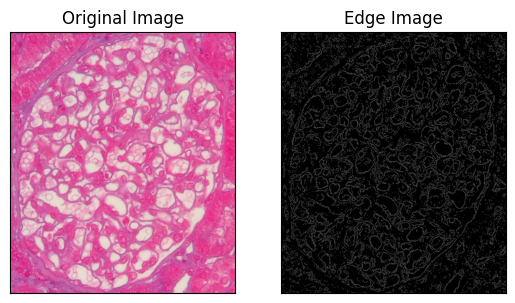

True

In [25]:
img = cv2.imread('./images/1_Normal_AZAN_0.JPG')
assert img is not None, "file could not be read, check with os.path.exists()"
edges = cv2.Canny(img,40,50)
converted_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
 
plt.subplot(121),plt.imshow(converted_img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
 
plt.show()
cv2.imwrite('./images/1_Normal_AZAN_0_edge.JPG', edges)

In [3]:
img.shape

(2837, 2448, 3)

In [15]:
transform = transforms.Compose([
    transforms.Resize(size=(224,224)),
                                                            transforms.ToTensor()])

In [23]:
image = transform(Image.open('./images/1_Normal_AZAN_0.JPG').convert('RGB'))
image.shape

torch.Size([3, 224, 224])

In [27]:
color_converted = cv2.cvtColor(edges, cv2.COLOR_BGR2RGB) 
color_converted.shape

(2837, 2448, 3)

In [29]:
# Displaying the converted image 
pil_image = Image.fromarray(color_converted) 
pil_image.show() 

In [24]:
transform(pil_image).shape

torch.Size([3, 224, 224])

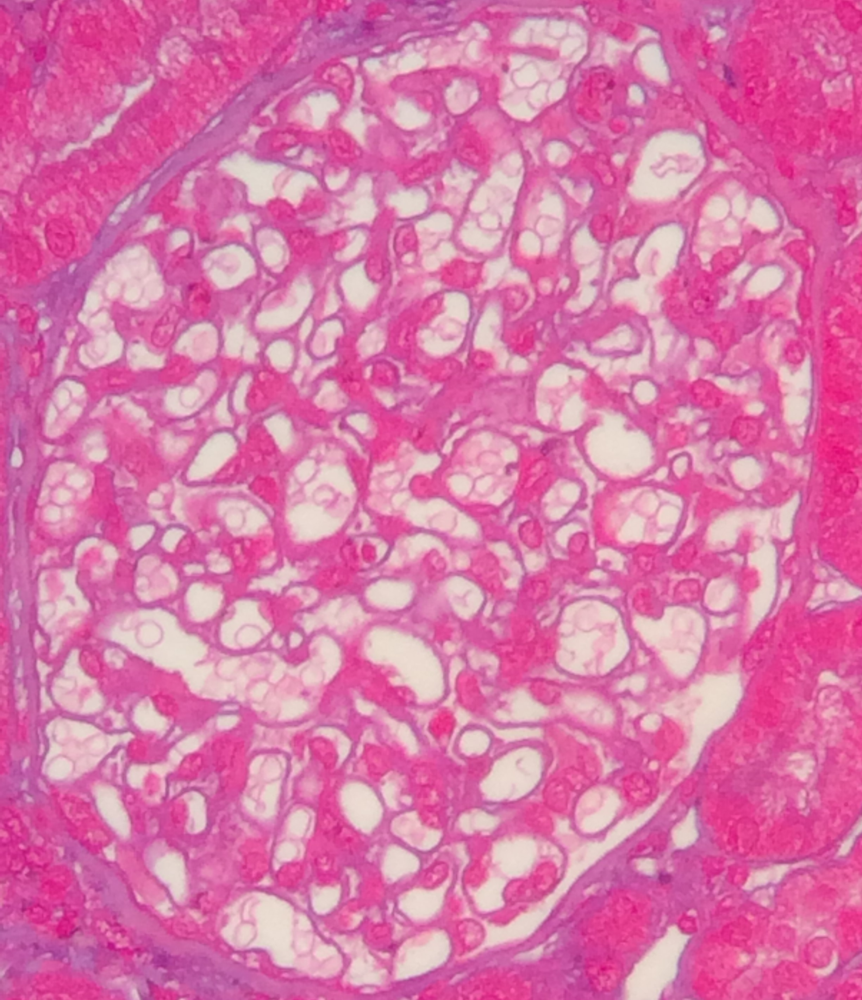

In [26]:
Image.open('./images/1_Normal_AZAN_0.JPG').convert('RGB')